In [1]:
import os
import pickle
import glob
import random
import time

import pandas as pd
import numpy as np
import scipy.stats as stats
import xarray as xr
import matplotlib.pyplot as plt

import npc_lims
# from npc_sessions import DynamicRoutingSession


In [2]:
all_ephys_sessions = tuple(s for s in npc_lims.get_session_info(is_ephys=True, is_uploaded=True,))

In [ ]:
session_projects={
    'session':[],
    'project':[]
}
for ss in all_ephys_sessions:
    session_projects['session'].append(str(ss.id))
    session_projects['project'].append(str(ss.project))

session_projects=pd.DataFrame(session_projects)
session_projects[:50]

In [2]:
#load decoding results
# loadpath=r"\\allen\programs\mindscope\workgroups\templeton\TTOC\decoding results\new_annotations\linear_shift_20_units"
# loadpath=r"\\allen\programs\mindscope\workgroups\dynamicrouting\shailaja\population_decoding"
loadpath=r"D:\decoding_results_from_CO\2024-10-30"

#loop through decoder results, append to dict
files=glob.glob(os.path.join(loadpath,'*_decoding_results*.pkl'))

In [ ]:
#load sessions as we go

#one big loop
use_half_shifts=False
n_repeats=25

decoder_confidence_versus_response_type={
    'session':[],
    'area':[],
    'project':[],
    'vis_context_dprime':[],
    'vis_hit_confidence':[],
    'vis_fa_confidence':[],
    'vis_cr_confidence':[],
    'aud_context_dprime':[],
    'aud_hit_confidence':[],
    'aud_fa_confidence':[],
    'aud_cr_confidence':[],
    'overall_dprime':[],
    'n_good_blocks':[],
    'correct_confidence':[],
    'incorrect_confidence':[],
    'cr_all_confidence':[],
    'fa_all_condfidence':[],
}

decoder_confidence_dprime_by_block={
    'session':[],
    'area':[],
    'project':[],
    'block':[],
    'cross_modal_dprime':[],
    'confidence':[]
}

decoder_confidence_by_switch={
    'session':[],
    'area':[],
    'project':[],
    'switch_trial':[],
    'block':[],
    'dprime_before':[],
    'dprime_after':[],
    'confidence':[]
}

decoder_confidence_versus_trials_since_rewarded_target={
    'session':[],
    'area':[],
    'project':[],
    'trials_since_rewarded_target':[],
    'time_since_rewarded_target':[],
    'confidence':[],
}

decoder_confidence_before_after_target={
    'session':[],
    'area':[],
    'project':[],
    'cross_modal_dprime':[],
    'rewarded_target':[],
    'rewarded_target_plus_one':[],
    'non_rewarded_target':[],
    'non_rewarded_target_plus_one':[],
    'non_response_non_rewarded_target':[],
    'non_response_non_rewarded_target_plus_one':[],
    'non_response_non_target_trials':[],
    'non_response_non_target_trials_plus_one':[],
}

# all_sessions=list(decoder_results.keys())

start_time=time.time()

##loop through sessions##
for file in files:
    session_start_time=time.time()
    decoder_results=pickle.load(open(file,'rb'))
    session_id=list(decoder_results.keys())[0]
    session_info=npc_lims.get_session_info(session_id)
    session_id_str=str(session_id)
    #load session
    try:
        trials=pd.read_parquet(
                npc_lims.get_cache_path('trials',session_id,version='any')
                )
        performance=pd.read_parquet(
                npc_lims.get_cache_path('performance',session_id,version='any')
                )
    except:
        print('skipping session:',session_id)
        continue

    #add trials/time since last rewarded target to trials table
    trials_since_rewarded_target=[]
    time_since_rewarded_target=[]
    last_rewarded_time=np.nan
    last_rewarded_trial=np.nan

    for tt,trial in trials.iterrows():
        # print(tt)
        trials_since_rewarded_target.append(tt-last_rewarded_trial)
        time_since_rewarded_target.append(trial['start_time']-last_rewarded_time)
        if trial['is_rewarded'] and trial['is_target'] and trial['is_response']:
            last_rewarded_time=trial['reward_time']
            last_rewarded_trial=tt
    trials['trials_since_rewarded_target']=trials_since_rewarded_target
    trials['time_since_rewarded_target']=time_since_rewarded_target
    
    #select the middle 4 blocks
    trials_middle=trials.iloc[decoder_results[session_id]['middle_4_blocks']]
    trials_middle=trials_middle.reset_index()
    trials_middle['id']=trials_middle.index.values
    

    areas=list(decoder_results[session_id]['results'].keys())

    ##loop through areas##
    for aa in areas:
        if type(aa)==str and 'probe' in aa:
            area_name=aa.split('_')[0]
        else:
            area_name=aa
        #make corrected decoder confidence
        shifts=decoder_results[session_id]['shifts']
        areas=decoder_results[session_id]['areas']
        half_neg_shift=np.round(shifts.min()/2)
        half_pos_shift=np.round(shifts.max()/2)
        half_neg_shift_ind=np.where(shifts==half_neg_shift)[0][0]
        half_pos_shift_ind=np.where(shifts==half_pos_shift)[0][0]
        half_shift_inds=np.arange(half_neg_shift_ind,half_pos_shift_ind+1)
        if use_half_shifts==False:
            half_shift_inds=np.arange(len(shifts))

        decision_function_shifts=[]
            
        for sh in half_shift_inds:
            temp_shifts=[]
            for rr in range(n_repeats):
                temp_shifts.append(decoder_results[session_id]['results'][aa]['shift'][rr][sh]['decision_function'])
            decision_function_shifts.append(np.nanmean(np.vstack(temp_shifts),axis=0))

        # true_label=decoder_results[session_id]['results'][aa]['shift'][np.where(shifts==0)[0][0]]['true_label']
        try:
            decision_function_shifts=np.vstack(decision_function_shifts)
        except:
            print(session_id,'failed to stack decision functions; skipping')
            continue
        
        # #normalize all decision function values to the stdev of all the nulls
        # decision_function_shifts=decision_function_shifts/np.nanstd(decision_function_shifts[:])

        corrected_decision_function=decision_function_shifts[shifts[half_shift_inds]==0,:].flatten()-np.mean(decision_function_shifts,axis=0)

        #option to normalize after
        # corrected_decision_function=corrected_decision_function/np.std(corrected_decision_function)

        #find average confidence per hit, fa, cr
        vis_HIT_mean=np.mean(corrected_decision_function[trials_middle.query('(is_correct==True and is_target==True and is_vis_context==True and \
                                                                             is_response==True and is_reward_scheduled==False)').index.values])
        aud_HIT_mean=np.mean(corrected_decision_function[trials_middle.query('(is_correct==True and is_target==True and is_vis_context==False and \
                                                                             is_response==True and is_reward_scheduled==False)').index.values])
        vis_CR_mean=np.mean(corrected_decision_function[trials_middle.query('(is_correct==True and is_target==True and is_vis_context==True and \
                                                                            is_response==False and is_reward_scheduled==False)').index.values])
        aud_CR_mean=np.mean(corrected_decision_function[trials_middle.query('(is_correct==True and is_target==True and is_vis_context==False and \
                                                                            is_response==False and is_reward_scheduled==False)').index.values])
        vis_FA_mean=np.mean(corrected_decision_function[trials_middle.query('(is_correct==False and is_target==True and is_vis_context==True and \
                                                                            is_response==True and is_reward_scheduled==False)').index.values])
        aud_FA_mean=np.mean(corrected_decision_function[trials_middle.query('(is_correct==False and is_target==True and is_vis_context==False and \
                                                                            is_response==True and is_reward_scheduled==False)').index.values])

        correct_mean=np.mean(np.hstack([corrected_decision_function[trials_middle.query('is_correct==True and is_target==True and is_reward_scheduled==False and is_vis_context==True').index.values],
                                        -corrected_decision_function[trials_middle.query('is_correct==True and is_target==True and is_reward_scheduled==False and is_vis_context==False').index.values]]))
        incorrect_mean=np.mean(np.hstack([corrected_decision_function[trials_middle.query('is_correct==False and is_target==True and is_reward_scheduled==False and is_vis_context==True').index.values],
                                        -corrected_decision_function[trials_middle.query('is_correct==False and is_target==True and is_reward_scheduled==False and is_vis_context==False').index.values]]))

        CR_all_mean=np.mean(np.hstack([corrected_decision_function[trials_middle.query('is_correct==True and is_target==True and is_reward_scheduled==False and is_vis_context==True and is_response==False').index.values],
                                        -corrected_decision_function[trials_middle.query('is_correct==True and is_target==True and is_reward_scheduled==False and is_vis_context==False and is_response==False').index.values]]))
        FA_all_mean=np.mean(np.hstack([corrected_decision_function[trials_middle.query('is_correct==False and is_target==True and is_reward_scheduled==False and is_vis_context==True and is_response==True').index.values],
                                        -corrected_decision_function[trials_middle.query('is_correct==False and is_target==True and is_reward_scheduled==False and is_vis_context==False and is_response==True').index.values]]))

        #append to table
        decoder_confidence_versus_response_type['session'].append(session_id)
        decoder_confidence_versus_response_type['area'].append(area_name)
        decoder_confidence_versus_response_type['project'].append(session_projects.query('session==@session_id_str')['project'].values[0])
        if performance.query('rewarded_modality=="vis"').empty:
            decoder_confidence_versus_response_type['vis_context_dprime'].append(np.nan)
        else:
            decoder_confidence_versus_response_type['vis_context_dprime'].append(performance.query('rewarded_modality=="vis"')['cross_modal_dprime'].values[0])
        decoder_confidence_versus_response_type['vis_hit_confidence'].append(vis_HIT_mean)
        decoder_confidence_versus_response_type['vis_fa_confidence'].append(vis_FA_mean)
        decoder_confidence_versus_response_type['vis_cr_confidence'].append(vis_CR_mean)
        if performance.query('rewarded_modality=="aud"').empty:
            decoder_confidence_versus_response_type['aud_context_dprime'].append(np.nan)
        else:
            decoder_confidence_versus_response_type['aud_context_dprime'].append(performance.query('rewarded_modality=="aud"')['cross_modal_dprime'].values[0])
        decoder_confidence_versus_response_type['aud_hit_confidence'].append(aud_HIT_mean)
        decoder_confidence_versus_response_type['aud_fa_confidence'].append(aud_FA_mean)
        decoder_confidence_versus_response_type['aud_cr_confidence'].append(aud_CR_mean)

        decoder_confidence_versus_response_type['overall_dprime'].append(performance['cross_modal_dprime'].mean())
        decoder_confidence_versus_response_type['n_good_blocks'].append(performance.query('cross_modal_dprime>=1.0')['cross_modal_dprime'].count())
        decoder_confidence_versus_response_type['correct_confidence'].append(correct_mean)
        decoder_confidence_versus_response_type['incorrect_confidence'].append(incorrect_mean)
        decoder_confidence_versus_response_type['cr_all_confidence'].append(CR_all_mean)
        decoder_confidence_versus_response_type['fa_all_condfidence'].append(FA_all_mean)


        #find decoder confidence according to time/trials since last rewarded target
        #3 arrays - time since last rewarded target, trials since last rewarded target, decoder confidence
        trials_since_rewarded_target=trials_middle.query('is_reward_scheduled==False')['trials_since_rewarded_target'].values
        time_since_rewarded_target=trials_middle.query('is_reward_scheduled==False')['time_since_rewarded_target'].values
        confidence=corrected_decision_function[trials_middle.query('is_reward_scheduled==False').index.values]
        for tt,trial in trials_middle.query('is_reward_scheduled==False').reset_index().iterrows():
            #reverse sign if other modality
            if trial['is_aud_context']:
                confidence[tt]=-confidence[tt]

        #append to table per session and area
        decoder_confidence_versus_trials_since_rewarded_target['session'].append(session_id)
        decoder_confidence_versus_trials_since_rewarded_target['area'].append(area_name)
        decoder_confidence_versus_trials_since_rewarded_target['project'].append(session_projects.query('session==@session_id_str')['project'].values[0])
        decoder_confidence_versus_trials_since_rewarded_target['trials_since_rewarded_target'].append(trials_since_rewarded_target)
        decoder_confidence_versus_trials_since_rewarded_target['time_since_rewarded_target'].append(time_since_rewarded_target)
        decoder_confidence_versus_trials_since_rewarded_target['confidence'].append(confidence)

        ##loop through blocks##
        blocks=trials_middle['block_index'].unique()
        for bb in blocks:
            block_trials=trials_middle.query('block_index==@bb and is_reward_scheduled==False')
            #find average confidence and dprime for the block
            if block_trials['is_vis_context'].values[0]:
                multiplier=1
            elif block_trials['is_aud_context'].values[0]:
                multiplier=-1
            
            block_dprime=performance.query('block_index==@bb')['cross_modal_dprime'].values[0]
            block_mean=np.nanmean(corrected_decision_function[block_trials.index.values])*multiplier

            #append to table
            decoder_confidence_dprime_by_block['session'].append(session_id)
            decoder_confidence_dprime_by_block['area'].append(area_name)
            decoder_confidence_dprime_by_block['project'].append(session_projects.query('session==@session_id_str')['project'].values[0])
            decoder_confidence_dprime_by_block['block'].append(bb)
            decoder_confidence_dprime_by_block['cross_modal_dprime'].append(block_dprime)
            decoder_confidence_dprime_by_block['confidence'].append(block_mean)

        #get confidence around the block switch
        switch_trials=trials_middle.query('is_context_switch')
        ##loop through switches##
        for st,switch_trial in switch_trials.iloc[1:].iterrows():
            if switch_trial['is_vis_context']:
                multiplier=1
            elif switch_trial['is_aud_context']:
                multiplier=-1
            switch_trial_block_index=switch_trial['block_index']
            #append to table
            decoder_confidence_by_switch['session'].append(session_id)
            decoder_confidence_by_switch['area'].append(area_name)
            decoder_confidence_by_switch['project'].append(session_projects.query('session==@session_id_str')['project'].values[0])
            decoder_confidence_by_switch['switch_trial'].append(switch_trial['id'])
            decoder_confidence_by_switch['block'].append(switch_trial_block_index)
            decoder_confidence_by_switch['dprime_before'].append(performance.query('block_index==(@switch_trial_block_index-1)')['cross_modal_dprime'].values[0])
            decoder_confidence_by_switch['dprime_after'].append(performance.query('block_index==(@switch_trial_block_index)')['cross_modal_dprime'].values[0])
            decoder_confidence_by_switch['confidence'].append(corrected_decision_function[switch_trial['id']-20:switch_trial['id']+30]*multiplier)

        #decoder confidence before/after rewarded target, response to non-rewarded target, non-response to non-rewarded target
        sign_corrected_decision_function=corrected_decision_function.copy()
        for tt,trial in trials_middle.iterrows():
            if trial['is_aud_context']:
                sign_corrected_decision_function[tt]=-sign_corrected_decision_function[tt]
        #find trial and trial+1 of rewarded targets
        rewarded_target_trials=trials_middle.query('is_rewarded==True and is_target==True and is_response==True and is_reward_scheduled==False').index.values
        rewarded_target_trials_plus_one=rewarded_target_trials+1
        if rewarded_target_trials_plus_one[-1]>=len(corrected_decision_function):
            rewarded_target_trials=rewarded_target_trials[:-1]
            rewarded_target_trials_plus_one=rewarded_target_trials_plus_one[:-1]

        #find trials and trials+1 of non-rewarded targets
        non_rewarded_target_trials=trials_middle.query('is_rewarded==False and is_target==True and is_response==True').index.values
        non_rewarded_target_trials_plus_one=non_rewarded_target_trials+1
        if len(non_rewarded_target_trials_plus_one)>0:
            if non_rewarded_target_trials_plus_one[-1]>=len(corrected_decision_function):
                non_rewarded_target_trials=non_rewarded_target_trials[:-1]
                non_rewarded_target_trials_plus_one=non_rewarded_target_trials_plus_one[:-1]

        #find trials and trials+1 of non-response to non-rewarded targets
        non_response_non_rewarded_target_trials=trials_middle.query('is_rewarded==False and is_target==True and is_response==False').index.values
        non_response_non_rewarded_target_trials_plus_one=non_response_non_rewarded_target_trials+1
        if len(non_response_non_rewarded_target_trials_plus_one)>0:
            if non_response_non_rewarded_target_trials_plus_one[-1]>=len(corrected_decision_function):
                non_response_non_rewarded_target_trials=non_response_non_rewarded_target_trials[:-1]
                non_response_non_rewarded_target_trials_plus_one=non_response_non_rewarded_target_trials_plus_one[:-1]

        non_response_non_target_trials=trials_middle.query('is_rewarded==False and is_target==False and is_response==False').index.values
        non_response_non_target_trials_plus_one=non_response_non_target_trials+1
        if len(non_response_non_target_trials_plus_one)>0:
            if non_response_non_target_trials_plus_one[-1]>=len(corrected_decision_function):
                non_response_non_target_trials=non_response_non_target_trials[:-1]
                non_response_non_target_trials_plus_one=non_response_non_target_trials_plus_one[:-1]

        #append to table
        decoder_confidence_before_after_target['session'].append(session_id)
        decoder_confidence_before_after_target['area'].append(area_name)
        decoder_confidence_before_after_target['project'].append(session_projects.query('session==@session_id_str')['project'].values[0])
        decoder_confidence_before_after_target['cross_modal_dprime'].append(performance['cross_modal_dprime'].mean())
        decoder_confidence_before_after_target['rewarded_target'].append(sign_corrected_decision_function[rewarded_target_trials])
        decoder_confidence_before_after_target['rewarded_target_plus_one'].append(sign_corrected_decision_function[rewarded_target_trials_plus_one])
        if len(non_rewarded_target_trials)>0:
            decoder_confidence_before_after_target['non_rewarded_target'].append(sign_corrected_decision_function[non_rewarded_target_trials])
            decoder_confidence_before_after_target['non_rewarded_target_plus_one'].append(sign_corrected_decision_function[non_rewarded_target_trials_plus_one])
        else:
            decoder_confidence_before_after_target['non_rewarded_target'].append(np.nan)
            decoder_confidence_before_after_target['non_rewarded_target_plus_one'].append(np.nan)
        if len(non_response_non_rewarded_target_trials)>0:
            decoder_confidence_before_after_target['non_response_non_rewarded_target'].append(sign_corrected_decision_function[non_response_non_rewarded_target_trials])
            decoder_confidence_before_after_target['non_response_non_rewarded_target_plus_one'].append(sign_corrected_decision_function[non_response_non_rewarded_target_trials_plus_one])        
        else:
            decoder_confidence_before_after_target['non_response_non_rewarded_target'].append(np.nan)
            decoder_confidence_before_after_target['non_response_non_rewarded_target_plus_one'].append(np.nan)
        decoder_confidence_before_after_target['non_response_non_target_trials'].append(sign_corrected_decision_function[non_response_non_target_trials])
        decoder_confidence_before_after_target['non_response_non_target_trials_plus_one'].append(sign_corrected_decision_function[non_response_non_target_trials_plus_one])

    total_time=time.time()-start_time
    session_time=time.time()-session_start_time
    print('finished session:',session_id)
    print('session time: ',session_time,' seconds;  total time:',total_time,' seconds')

decoder_confidence_versus_response_type=pd.DataFrame(decoder_confidence_versus_response_type)
decoder_confidence_dprime_by_block=pd.DataFrame(decoder_confidence_dprime_by_block)
decoder_confidence_by_switch=pd.DataFrame(decoder_confidence_by_switch)
decoder_confidence_versus_trials_since_rewarded_target=pd.DataFrame(decoder_confidence_versus_trials_since_rewarded_target)
decoder_confidence_before_after_target=pd.DataFrame(decoder_confidence_before_after_target)


In [27]:
decoder_confidence_versus_response_type=pd.DataFrame(decoder_confidence_versus_response_type)
decoder_confidence_dprime_by_block=pd.DataFrame(decoder_confidence_dprime_by_block)
decoder_confidence_by_switch=pd.DataFrame(decoder_confidence_by_switch)
decoder_confidence_versus_trials_since_rewarded_target=pd.DataFrame(decoder_confidence_versus_trials_since_rewarded_target)
decoder_confidence_before_after_target=pd.DataFrame(decoder_confidence_before_after_target)

In [28]:
# savepath=os.path.join(loadpath,"combined","no_normalization")

decoder_confidence_versus_response_type.to_csv(os.path.join(savepath,'decoder_confidence_versus_response_type.csv'))
decoder_confidence_dprime_by_block.to_csv(os.path.join(savepath,'decoder_confidence_dprime_by_block.csv'))
decoder_confidence_by_switch.to_csv(os.path.join(savepath,'decoder_confidence_by_switch.csv'))
decoder_confidence_versus_trials_since_rewarded_target.to_csv(os.path.join(savepath,'decoder_confidence_versus_trials_since_rewarded_target.csv'))
decoder_confidence_before_after_target.to_csv(os.path.join(savepath,'decoder_confidence_before_after_target.csv'))

In [4]:
# #load data
# n_units='_20_units'
# # savepath=r"\\allen\programs\mindscope\workgroups\templeton\TTOC\decoding results\new_annotations\linear_shift_20_units\combined\no_normalization"
# # savepath=r"\\allen\programs\mindscope\workgroups\dynamicrouting\shailaja\population_decoding"
# savepath=r"D:\decoding_results_from_CO\lda_test_2024-11-11"
# decoder_confidence_versus_response_type=pd.read_csv(os.path.join(savepath,'decoder_confidence_versus_response_type'+n_units+'.csv'))
# decoder_confidence_dprime_by_block=pd.read_csv(os.path.join(savepath,'decoder_confidence_dprime_by_block'+n_units+'.csv'))
# decoder_confidence_by_switch=pd.read_csv(os.path.join(savepath,'decoder_confidence_by_switch'+n_units+'.csv'))
# decoder_confidence_versus_trials_since_rewarded_target=pd.read_csv(os.path.join(savepath,'decoder_confidence_versus_trials_since_rewarded_target'+n_units+'.csv'))
# decoder_confidence_before_after_target=pd.read_csv(os.path.join(savepath,'decoder_confidence_before_after_target'+n_units+'.csv'))


In [2]:
#load data
n_units='_20_units'
# savepath=r"\\allen\programs\mindscope\workgroups\templeton\TTOC\decoding results\new_annotations\linear_shift_20_units\combined\no_normalization"
# savepath=r"\\allen\programs\mindscope\workgroups\dynamicrouting\shailaja\population_decoding"
savepath=r"D:\decoding_results_from_CO\logreg_test_2024-11-13"
decoder_confidence_versus_response_type=pd.read_pickle(os.path.join(savepath,'decoder_confidence_versus_response_type'+n_units+'.pkl'))
decoder_confidence_dprime_by_block=pd.read_pickle(os.path.join(savepath,'decoder_confidence_dprime_by_block'+n_units+'.pkl'))
decoder_confidence_by_switch=pd.read_pickle(os.path.join(savepath,'decoder_confidence_by_switch'+n_units+'.pkl'))
decoder_confidence_versus_trials_since_rewarded_target=pd.read_pickle(os.path.join(savepath,'decoder_confidence_versus_trials_since_rewarded_target'+n_units+'.pkl'))
decoder_confidence_before_after_target=pd.read_pickle(os.path.join(savepath,'decoder_confidence_before_after_target'+n_units+'.pkl'))


In [ ]:
#add "correct" vs "incorrect" columns, plus don't separate by vis/aud, also add number of good blocks

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_21248\2635504682.py:26: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  cr_fa_diff_by_area['vis_context_cr_fa_diff_sem'].append(stats.sem(sel_area['vis_cr_confidence']-sel_area['vis_fa_confidence']))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_21248\2635504682.py:29: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  cr_fa_diff_by_area['aud_context_cr_fa_diff_sem'].append(stats.sem(sel_area['aud_cr_confidence']-sel_area['aud_fa_confidence']))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_21248\2635504682.py:33: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  cr_fa_diff_by_area['mean_diff_sem'].append(stats.sem(mean_diffs))
C:\Users\eth

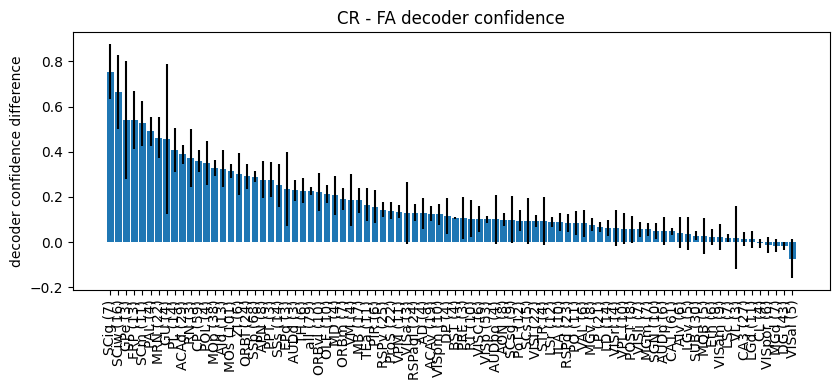

In [3]:
dprime_threshold=1.0
sel_project='DynamicRouting'
min_n_sessions=3

cr_fa_diff_by_area={
    'area':[],
    'n_sessions':[],
    'vis_context_dprime':[],
    'vis_context_cr_fa_diff':[],
    'vis_context_cr_fa_diff_sem':[],
    'aud_context_dprime':[],
    'aud_context_cr_fa_diff':[],
    'aud_context_cr_fa_diff_sem':[],
    'mean_diff':[],
    'mean_diff_sem':[],
    'total_diff':[],
}

for aa in decoder_confidence_versus_response_type['area'].unique():
    # sel_area=decoder_confidence_versus_response_type.query('area==@aa and vis_context_dprime>=@dprime_threshold and aud_context_dprime>=@dprime_threshold and project.str.contains(@sel_project)')
    sel_area=decoder_confidence_versus_response_type.query('area==@aa and n_good_blocks>=4 and project.str.contains(@sel_project)')
    cr_fa_diff_by_area['area'].append(aa)
    cr_fa_diff_by_area['n_sessions'].append(len(sel_area))
    cr_fa_diff_by_area['vis_context_dprime'].append(np.mean(sel_area['vis_context_dprime']))
    cr_fa_diff_by_area['vis_context_cr_fa_diff'].append(np.mean(sel_area['vis_cr_confidence']-sel_area['vis_fa_confidence']))
    cr_fa_diff_by_area['vis_context_cr_fa_diff_sem'].append(stats.sem(sel_area['vis_cr_confidence']-sel_area['vis_fa_confidence']))
    cr_fa_diff_by_area['aud_context_dprime'].append(np.mean(sel_area['aud_context_dprime']))
    cr_fa_diff_by_area['aud_context_cr_fa_diff'].append(np.mean(sel_area['aud_cr_confidence']-sel_area['aud_fa_confidence']))
    cr_fa_diff_by_area['aud_context_cr_fa_diff_sem'].append(stats.sem(sel_area['aud_cr_confidence']-sel_area['aud_fa_confidence']))
    cr_fa_diff_by_area['mean_diff'].append(np.mean([cr_fa_diff_by_area['vis_context_cr_fa_diff'][-1],-cr_fa_diff_by_area['aud_context_cr_fa_diff'][-1]]))

    mean_diffs=(sel_area['vis_cr_confidence'].values+sel_area['aud_cr_confidence'].values)/2-(sel_area['vis_fa_confidence'].values+sel_area['aud_fa_confidence'].values)/2
    cr_fa_diff_by_area['mean_diff_sem'].append(stats.sem(mean_diffs))

    cr_fa_diff_by_area['total_diff'].append(np.sum([np.abs(cr_fa_diff_by_area['vis_context_cr_fa_diff'][-1]),np.abs(cr_fa_diff_by_area['aud_context_cr_fa_diff'][-1])]))


cr_fa_diff_by_area=pd.DataFrame(cr_fa_diff_by_area)

plot_data=cr_fa_diff_by_area.query('n_sessions>=@min_n_sessions').sort_values(by='mean_diff',ascending=False)

fig,ax=plt.subplots(figsize=(8.5,4))
ax.bar(plot_data['area'],plot_data['mean_diff'],yerr=plot_data['mean_diff_sem'])
# ax.bar(plot_data['area'],plot_data['vis_context_cr_fa_diff'])#,yerr=[plot_data['vis_context_cr_fa_diff_sem']])
# ax.bar(plot_data['area'],-plot_data['aud_context_cr_fa_diff'],bottom=plot_data['vis_context_cr_fa_diff'])#,yerr=[plot_data['aud_context_cr_fa_diff_sem']])
# plot_data.plot.bar(x='area',y='vis_context_cr_fa_diff',yerr=plot_data['vis_context_cr_fa_diff_sem'],ax=ax)

area_labels=[]
for i in range(plot_data.shape[0]):
    area_labels.append(plot_data['area'].iloc[i]+' ('+str(plot_data['n_sessions'].iloc[i])+')')
ax.set_xticks(np.arange(len(plot_data)))
ax.set_xticklabels(area_labels,rotation=90,ha='center')
ax.set_ylabel('decoder confidence difference')

ax.set_title('CR - FA decoder confidence')

# ax.legend(['vis context','aud context'])

fig.tight_layout()


In [ ]:
# cr_fa_diff_by_area.to_csv(os.path.join(savepath,'cr_fa_diff_by_area_bad_behavior.csv'))

In [ ]:
decoder_confidence_versus_response_type.columns

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_21248\4069412919.py:21: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  correct_incorrect_diff_by_area['correct_incorrect_diff_sem'].append(stats.sem(sel_area['correct_confidence']-sel_area['incorrect_confidence']))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_21248\4069412919.py:21: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  correct_incorrect_diff_by_area['correct_incorrect_diff_sem'].append(stats.sem(sel_area['correct_confidence']-sel_area['incorrect_confidence']))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_21248\4069412919.py:21: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  correct_incorrect_diff_by_area['correct_incorr

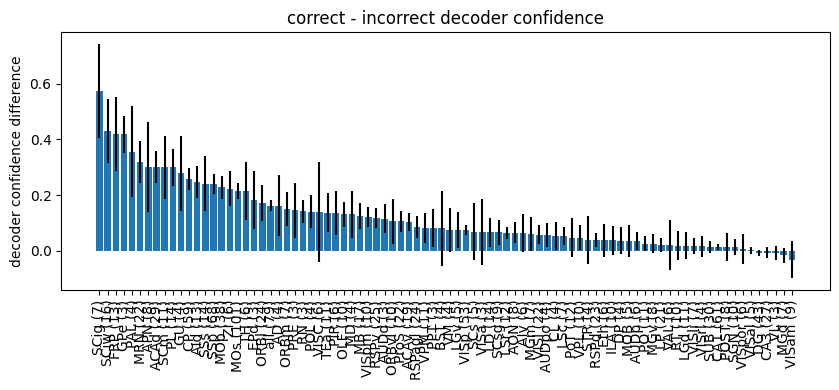

In [4]:
dprime_threshold=1.0
sel_project='DynamicRouting'
min_n_sessions=3
min_n_good_blocks=4

correct_incorrect_diff_by_area={
    'area':[],
    'n_sessions':[],
    'dprime':[],
    'correct_incorrect_diff':[],
    'correct_incorrect_diff_sem':[],

}

for aa in decoder_confidence_versus_response_type['area'].unique():
    sel_area=decoder_confidence_versus_response_type.query('area==@aa and n_good_blocks>=@min_n_good_blocks and project.str.contains(@sel_project)')
    correct_incorrect_diff_by_area['area'].append(aa)
    correct_incorrect_diff_by_area['n_sessions'].append(len(sel_area))
    correct_incorrect_diff_by_area['dprime'].append(np.mean(sel_area['overall_dprime']))
    correct_incorrect_diff_by_area['correct_incorrect_diff'].append(np.mean(sel_area['correct_confidence']-sel_area['incorrect_confidence']))
    correct_incorrect_diff_by_area['correct_incorrect_diff_sem'].append(stats.sem(sel_area['correct_confidence']-sel_area['incorrect_confidence']))



correct_incorrect_diff_by_area=pd.DataFrame(correct_incorrect_diff_by_area)

plot_data=correct_incorrect_diff_by_area.query('n_sessions>=@min_n_sessions').sort_values(by='correct_incorrect_diff',ascending=False)

fig,ax=plt.subplots(figsize=(8.5,4))
ax.bar(plot_data['area'],plot_data['correct_incorrect_diff'],yerr=plot_data['correct_incorrect_diff_sem'])
# ax.bar(plot_data['area'],plot_data['vis_context_cr_fa_diff'])#,yerr=[plot_data['vis_context_cr_fa_diff_sem']])
# ax.bar(plot_data['area'],-plot_data['aud_context_cr_fa_diff'],bottom=plot_data['vis_context_cr_fa_diff'])#,yerr=[plot_data['aud_context_cr_fa_diff_sem']])
# plot_data.plot.bar(x='area',y='vis_context_cr_fa_diff',yerr=plot_data['vis_context_cr_fa_diff_sem'],ax=ax)

area_labels=[]
for i in range(plot_data.shape[0]):
    area_labels.append(plot_data['area'].iloc[i]+' ('+str(plot_data['n_sessions'].iloc[i])+')')
ax.set_xticks(np.arange(len(plot_data)))
ax.set_xticklabels(area_labels,rotation=90,ha='center')
ax.set_ylabel('decoder confidence difference')

ax.set_title('correct - incorrect decoder confidence')

# ax.legend(['vis context','aud context'])

fig.tight_layout()


In [48]:
# correct_incorrect_diff_by_area.to_csv(os.path.join(savepath,'correct_incorrect_diff_by_area_bad_behavior_not_norm.csv'))

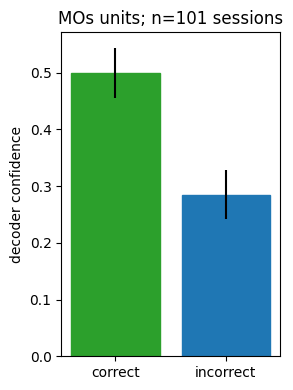

In [6]:
#correct vs. incorrect
dprime_threshold=1.0
sel_project='DynamicRouting'
min_n_recs=3
# for aa in decoder_confidence_versus_response_type['area'].unique():
aa='MOs'

sel_area=decoder_confidence_versus_response_type.query('area==@aa and n_good_blocks>=4 and project.str.contains(@sel_project)')

fig,ax=plt.subplots(1,1,figsize=(3,4))
ax.axhline(0,color='k',linewidth=0.5)
bars=ax.bar([0,1],sel_area[['correct_confidence','incorrect_confidence',]].mean().values)
ax.errorbar([0,1],sel_area[['correct_confidence','incorrect_confidence']].mean().values,
            yerr=sel_area[['correct_confidence','incorrect_confidence',]].sem().values,linestyle='',color='k')
ax.set_xticks([0,1])
ax.set_xticklabels(['correct','incorrect'])
bars[0].set_color('tab:green')
bars[1].set_color('tab:blue')

ax.set_title(str(aa)+' units; n='+str(len(sel_area))+' sessions')
# ax.set_ylim([-0.05,0.4])
ax.set_ylabel('decoder confidence')
fig.tight_layout()

(-1.0, 1.0)

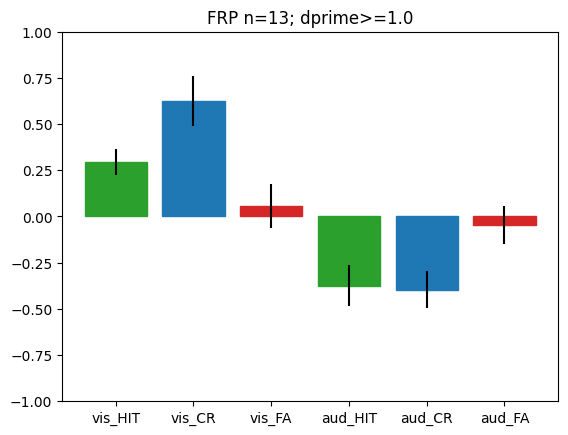

In [9]:
#cr vs. fa
dprime_threshold=1.0
sel_project='DynamicRouting'
min_n_recs=3
# for aa in decoder_confidence_versus_response_type['area'].unique():
aa='FRP'

sel_area=decoder_confidence_versus_response_type.query('area==@aa and vis_context_dprime>=@dprime_threshold and aud_context_dprime>=@dprime_threshold and project.str.contains(@sel_project)')

fig,ax=plt.subplots(1,1)
bars=ax.bar([0,1,2,3,4,5],sel_area[['vis_hit_confidence','vis_cr_confidence','vis_fa_confidence','aud_hit_confidence','aud_cr_confidence','aud_fa_confidence']].mean().values)
ax.errorbar([0,1,2,3,4,5],sel_area[['vis_hit_confidence','vis_cr_confidence','vis_fa_confidence','aud_hit_confidence','aud_cr_confidence','aud_fa_confidence']].mean().values,
            yerr=sel_area[['vis_hit_confidence','vis_cr_confidence','vis_fa_confidence','aud_hit_confidence','aud_cr_confidence','aud_fa_confidence']].sem().values,linestyle='',color='k')
ax.set_xticks([0,1,2,3,4,5])
ax.set_xticklabels(['vis_HIT','vis_CR','vis_FA','aud_HIT','aud_CR','aud_FA'])
bars[0].set_color('tab:green')
bars[1].set_color('tab:blue')
bars[2].set_color('tab:red')
bars[3].set_color('tab:green')
bars[4].set_color('tab:blue')
bars[5].set_color('tab:red')
ax.set_title(str(aa)+' n='+str(len(sel_area))+'; dprime>='+str(dprime_threshold))
ax.set_ylim([-1,1])

In [8]:
def parse_strings_from_csv(input_string):

    parsed_list=np.array(input_string.replace('[','').replace(']','').replace('\n','').replace('  ',' ').replace('   ',' ').replace(' ',',').replace(',,',',nan,').split(','))

    parsed_list[parsed_list=='']='nan'

    parsed_list=parsed_list.astype(float)

    return parsed_list

# np.array(decoder_confidence_by_switch['confidence'][0].replace('[','').replace(']','').replace('\n','').replace('  ',' ').replace('   ',' ').split(' ')).astype(float)
# decoder_confidence_by_switch['confidence'][0]
# [np.arange(0,pre_switch_ind)]

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\2117497221.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pre_switch_confidence.append(np.nanmean(switch['confidence'][np.arange(0,pre_switch_ind)]))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\2117497221.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  pre_switch_confidence.append(np.nanmean(switch['confidence'][np.arange(0,pre_switch_ind)]))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\2117497221.py:41: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single elem

Text(0.5, 1.0, 'raw confidence after second trial of switch')

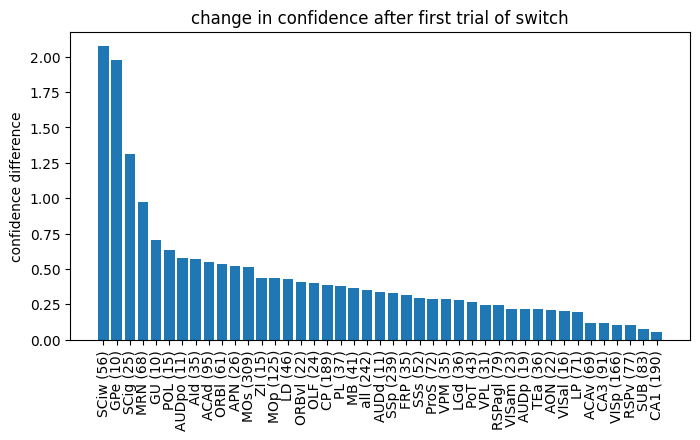

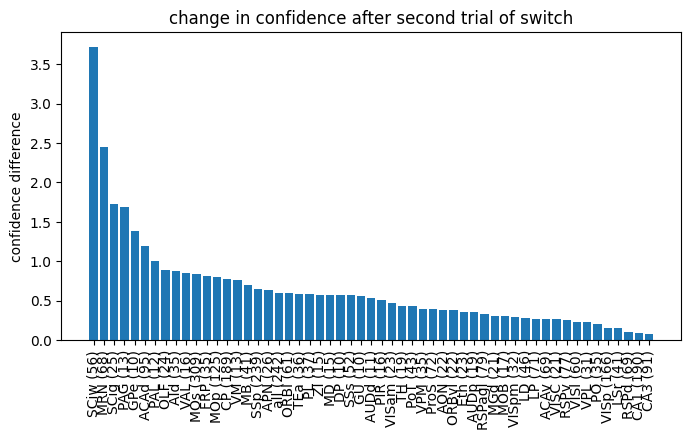

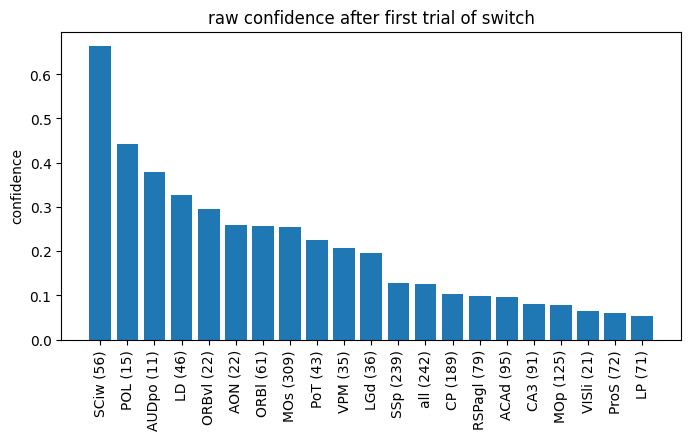

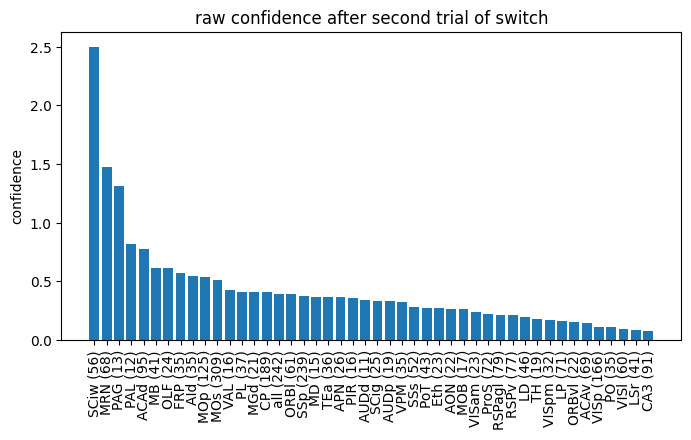

In [10]:
#plot diff btwn trial 0 and 1 by area
xvect=np.arange(-20,30)
pre_switch_ind=np.where(xvect==0)[0]
post_switch_ind=np.where(xvect==1)[0]
min_dprime=1.0

min_n_switches=10

switch_changes={
    'area':[],
    'n_switches':[],
    'pre_switch_confidence':[],
    'post_switch_confidence':[],
    'post_switch_confidence_mean':[],
    'post_switch_plus_one_confidence':[],
    'post_switch_plus_one_confidence_mean':[],
    'diff':[],
    'p':[],
    'plus_one_diff':[],
    'plus_one_diff_p':[],
    'p_raw':[],
    'p_raw_plus_one':[],
}

for aa in decoder_confidence_by_switch['area'].unique():
    sel_area=decoder_confidence_by_switch.query('area==@aa and project.str.contains(@sel_project) and dprime_before>=@min_dprime and dprime_after>=@min_dprime')
    if len(sel_area)<min_n_switches:
        continue
    pre_switch_confidence=[]
    post_switch_confidence=[]
    post_switch_plus_one_confidence=[]
    for ss,switch in sel_area.iterrows():
        if type(switch['confidence'])==str:
            temp_confidence=parse_strings_from_csv(switch['confidence'])
        else:
            temp_confidence=switch['confidence']
        if len(temp_confidence)<50:
            continue
        switch['confidence']=temp_confidence
        # pre_switch_confidence.append(switch['confidence'][pre_switch_ind])
        pre_switch_confidence.append(np.nanmean(switch['confidence'][np.arange(0,pre_switch_ind)]))
        post_switch_confidence.append(switch['confidence'][post_switch_ind][0])
        post_switch_plus_one_confidence.append(switch['confidence'][post_switch_ind+1][0])
    
    pre_switch_confidence=np.asarray(pre_switch_confidence)
    post_switch_confidence=np.asarray(post_switch_confidence)
    post_switch_plus_one_confidence=np.asarray(post_switch_plus_one_confidence)
    
    switch_changes['area'].append(aa)
    switch_changes['n_switches'].append(len(sel_area))
    switch_changes['pre_switch_confidence'].append(pre_switch_confidence)
    switch_changes['post_switch_confidence'].append(post_switch_confidence)
    switch_changes['post_switch_confidence_mean'].append(np.nanmedian(post_switch_confidence))
    switch_changes['post_switch_plus_one_confidence'].append(post_switch_plus_one_confidence)
    switch_changes['post_switch_plus_one_confidence_mean'].append(np.nanmedian(post_switch_plus_one_confidence))
    switch_changes['diff'].append(np.nanmedian(post_switch_confidence-pre_switch_confidence))
    switch_changes['p'].append(stats.wilcoxon(pre_switch_confidence,post_switch_confidence,nan_policy='omit')[1])
    switch_changes['plus_one_diff'].append(np.nanmedian(post_switch_plus_one_confidence-pre_switch_confidence))
    switch_changes['plus_one_diff_p'].append(stats.wilcoxon(pre_switch_confidence,post_switch_plus_one_confidence,nan_policy='omit')[1])
    switch_changes['p_raw'].append(stats.wilcoxon(post_switch_confidence,nan_policy='omit')[1])
    switch_changes['p_raw_plus_one'].append(stats.wilcoxon(post_switch_plus_one_confidence,nan_policy='omit')[1])


switch_changes=pd.DataFrame(switch_changes)

plot_data=switch_changes.query('n_switches>=@min_n_switches and p<0.05').sort_values(by='diff',ascending=False)

fig,ax=plt.subplots(figsize=(8,4))
ax.bar(plot_data['area'],plot_data['diff'])
area_labels=[]
for i in range(plot_data.shape[0]):
    area_labels.append(plot_data['area'].iloc[i]+' ('+str(plot_data['n_switches'].iloc[i])+')')
ax.set_xticks(np.arange(len(plot_data)))
ax.set_xticklabels(area_labels,rotation=90,ha='center')

ax.set_ylabel('confidence difference')
ax.set_title('change in confidence after first trial of switch')

plot_data=switch_changes.query('n_switches>=@min_n_switches and plus_one_diff_p<0.05').sort_values(by='plus_one_diff',ascending=False)

fig,ax=plt.subplots(figsize=(8,4))
ax.bar(plot_data['area'],plot_data['plus_one_diff'])
area_labels=[]
for i in range(plot_data.shape[0]):
    area_labels.append(plot_data['area'].iloc[i]+' ('+str(plot_data['n_switches'].iloc[i])+')')
ax.set_xticks(np.arange(len(plot_data)))
ax.set_xticklabels(area_labels,rotation=90,ha='center')

ax.set_ylabel('confidence difference')
ax.set_title('change in confidence after second trial of switch')

#raw confidence after switch
plot_data=switch_changes.query('n_switches>=@min_n_switches and p_raw<0.05').sort_values(by='post_switch_confidence_mean',ascending=False)

fig,ax=plt.subplots(figsize=(8,4))
ax.bar(plot_data['area'],plot_data['post_switch_confidence_mean'])
area_labels=[]
for i in range(plot_data.shape[0]):
    area_labels.append(plot_data['area'].iloc[i]+' ('+str(plot_data['n_switches'].iloc[i])+')')
ax.set_xticks(np.arange(len(plot_data)))
ax.set_xticklabels(area_labels,rotation=90,ha='center')

ax.set_ylabel('confidence')
ax.set_title('raw confidence after first trial of switch')

#raw confidence after switch +1
plot_data=switch_changes.query('n_switches>=@min_n_switches and p_raw_plus_one<0.05').sort_values(by='post_switch_plus_one_confidence_mean',ascending=False)

fig,ax=plt.subplots(figsize=(8,4))
ax.bar(plot_data['area'],plot_data['post_switch_plus_one_confidence_mean'])
area_labels=[]
for i in range(plot_data.shape[0]):
    area_labels.append(plot_data['area'].iloc[i]+' ('+str(plot_data['n_switches'].iloc[i])+')')
ax.set_xticks(np.arange(len(plot_data)))
ax.set_xticklabels(area_labels,rotation=90,ha='center')

ax.set_ylabel('confidence')
ax.set_title('raw confidence after second trial of switch')


In [ ]:
switch_changes

In [ ]:
# switch['confidence']
# # type(test)

# parsed_list=np.array(switch['confidence'].replace('[','').replace(']','').replace('\n','').replace('  ',' ').replace('   ',' ').replace(' ',',').replace(',,',',nan,').split(','))

# parsed_list[parsed_list=='']='nan'

# parsed_list.astype(float)

# post_switch_confidence

# switch['confidence'][np.arange(0,pre_switch_ind)]

# switch['confidence'][post_switch_ind+1]

sel_area


C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\105445869.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(1,1)


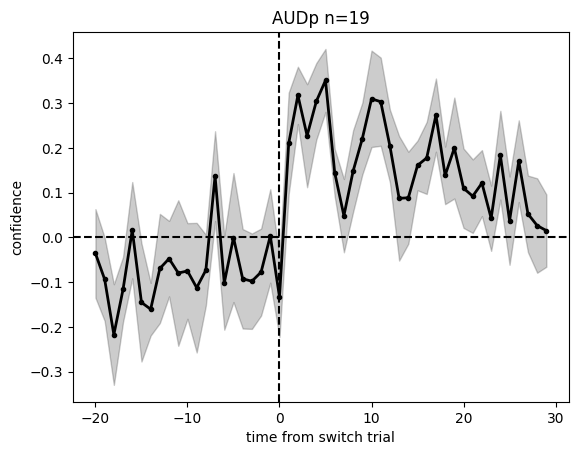

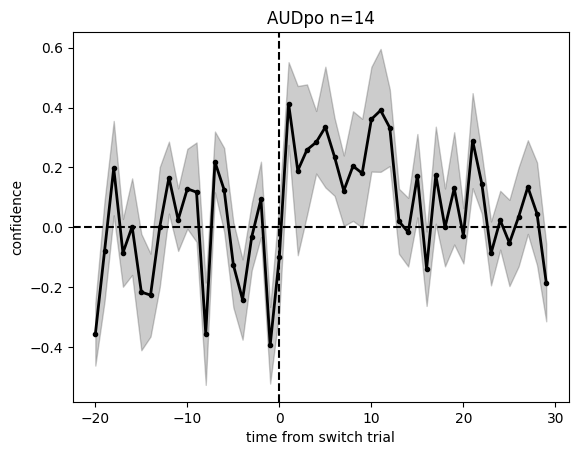

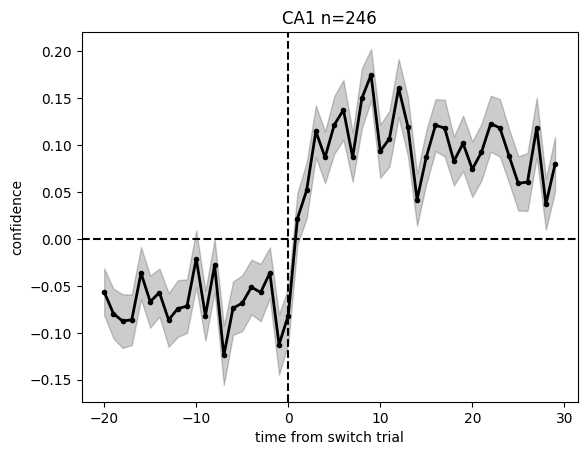

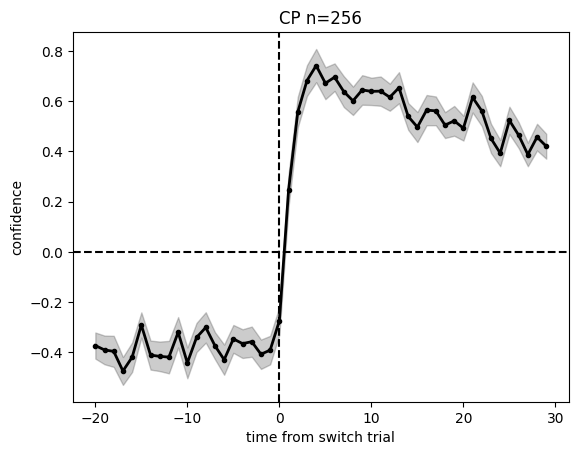

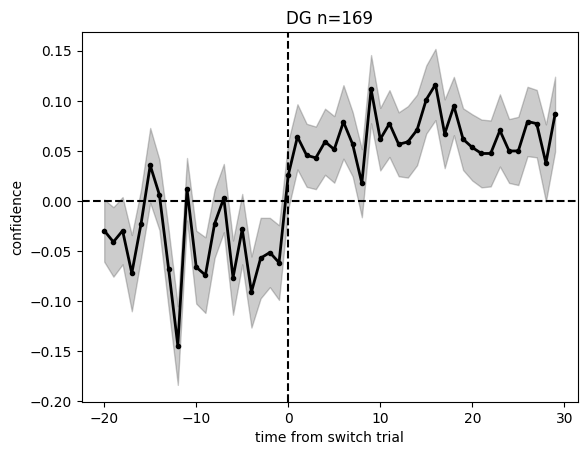

...

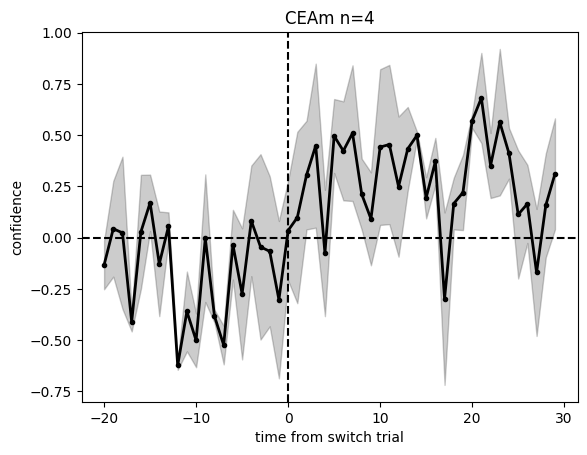

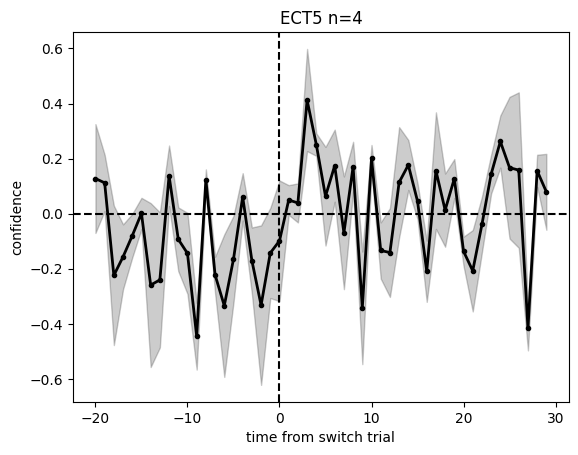

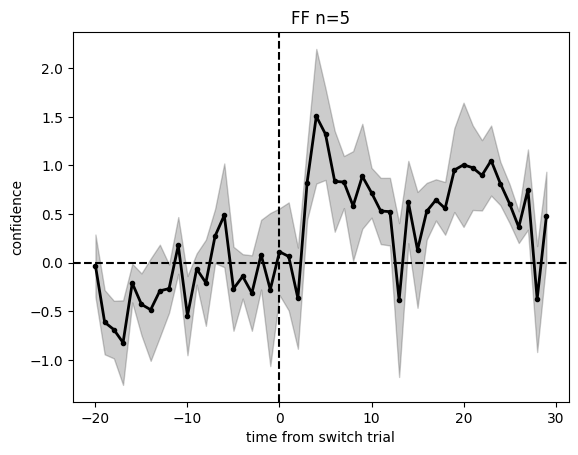

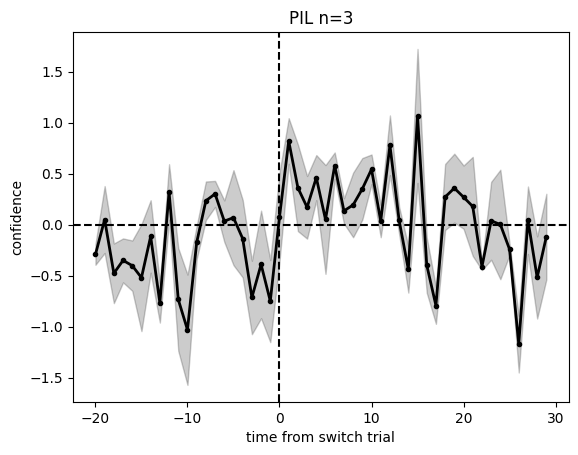

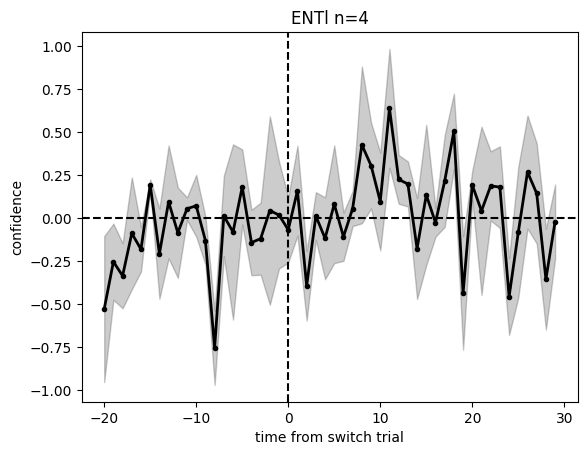

In [13]:
xvect=np.arange(-20,30)
dprime_threshold=0.5
min_n_recs=3
for aa in decoder_confidence_by_switch['area'].unique():
    # aa='MRN'
    if type(aa)==str and 'probe' in aa:
        continue
    sel_area=decoder_confidence_by_switch.query('area==@aa and dprime_before>=@dprime_threshold and dprime_after>=@dprime_threshold and project.str.contains(@sel_project)')

    if len(sel_area)<min_n_recs:
        continue
    stackable=[]
    for xx in sel_area['confidence'].values:
        if type(xx)==str:
            temp_confidence=parse_strings_from_csv(xx)
        else:
            temp_confidence=xx
        if len(temp_confidence)==50:
            stackable.append(temp_confidence)
    if len(stackable)==0:
        continue
    n_switches=len(stackable)
    stackable=np.vstack(stackable)
    mean_confidence=np.nanmean(stackable,axis=0)

    fig,ax=plt.subplots(1,1)
    # for st,switch_trial in sel_area.iterrows():
        # if len(switch_trial['confidence'])==50:
        #     ax.plot(xvect,switch_trial['confidence'],color='gray',alpha=0.3)
    ax.axvline(0,color='k',linestyle='--')
    ax.axhline(0,color='k',linestyle='--')
    ax.plot(xvect,mean_confidence,'k.-',linewidth=2)
    ax.fill_between(xvect,np.nanmean(stackable,axis=0)-stats.sem(stackable,axis=0,nan_policy='omit'),
                    np.nanmean(stackable,axis=0)+stats.sem(stackable,axis=0,nan_policy='omit'),alpha=0.2,color='k')

    ax.set_title(str(aa)+' n='+str(n_switches))
    ax.set_xlabel('time from switch trial')
    ax.set_ylabel('confidence')
    # ax.set_ylim([-0.5,0.75])
    # ax.set_xlim([-5,10])

In [ ]:
decoder_confidence_versus_trials_since_rewarded_target

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\3548895776.py:46: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  sem_confidence.append(stats.sem(all_confidence[all_trials_since_rewarded_target==tt]))


(-0.2, 20.0)

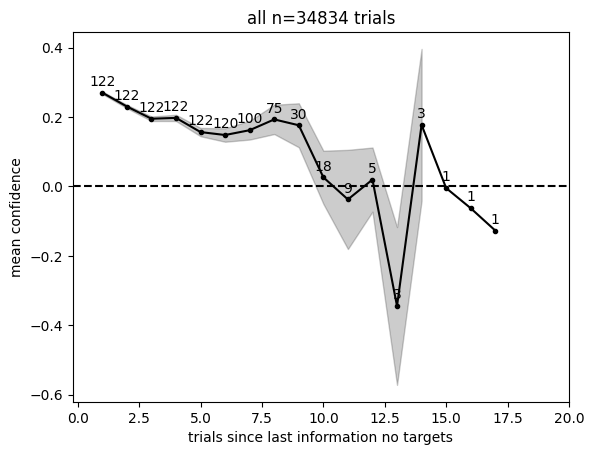

In [16]:
#plot mean confidence per trial since rewarded target
sel_project='DynamicRouting'
aa='all'
sel_area=decoder_confidence_versus_trials_since_rewarded_target.query('area==@aa and project.str.contains(@sel_project)')

metric='trials_since_last_information_no_targets'
# metric='trials_since_rewarded_target'
#loop through rows and parse strings
confidence=[]
trials_since_rewarded_target=[]
session_ids=[]
for rr,row in sel_area.iterrows():
    if type(row['confidence'])==str:
        temp_confidence=parse_strings_from_csv(row['confidence'])
        temp_trials_since_rewarded_target=parse_strings_from_csv(row[metric])
    else:
        temp_confidence=row['confidence']
        temp_trials_since_rewarded_target=row[metric]
        if 0 in temp_trials_since_rewarded_target:
            temp_trials_since_rewarded_target=temp_trials_since_rewarded_target[:-1]+1
            temp_confidence=temp_confidence[1:]
    if len(temp_confidence)==len(temp_trials_since_rewarded_target):
        confidence.append(temp_confidence)
        trials_since_rewarded_target.append(temp_trials_since_rewarded_target)

    session_ids.append([row['session']]*len(temp_confidence))

# all_confidence=np.hstack(sel_area['confidence'].values)
all_confidence=np.hstack(confidence)
# all_trials_since_rewarded_target=np.hstack(sel_area['trials_since_rewarded_target'].values)
all_trials_since_rewarded_target=np.hstack(trials_since_rewarded_target)

all_session_ids=np.hstack(session_ids)

#remove nans
nan_inds=np.where(np.isnan(all_confidence)|np.isnan(all_trials_since_rewarded_target))[0]
all_confidence=np.delete(all_confidence,nan_inds)
all_trials_since_rewarded_target=np.delete(all_trials_since_rewarded_target,nan_inds)
all_session_ids=np.delete(all_session_ids,nan_inds)

mean_confidence=[]
sem_confidence=[]
n_sessions_per_point=[]
for tt in np.unique(all_trials_since_rewarded_target):
    mean_confidence.append(np.nanmean(all_confidence[all_trials_since_rewarded_target==tt]))
    sem_confidence.append(stats.sem(all_confidence[all_trials_since_rewarded_target==tt]))
    n_sessions_per_point.append(len(np.unique(all_session_ids[all_trials_since_rewarded_target==tt])))

fig,ax=plt.subplots(1,1)
ax.axhline(0,color='k',linestyle='--')
ax.plot(np.unique(all_trials_since_rewarded_target),mean_confidence,'k.-')
ax.fill_between(np.unique(all_trials_since_rewarded_target),np.array(mean_confidence)-np.array(sem_confidence),np.array(mean_confidence)+np.array(sem_confidence),alpha=0.2,color='k')
for nn in range(len(n_sessions_per_point)):
    ax.text(np.unique(all_trials_since_rewarded_target)[nn],np.array(mean_confidence)[nn]+0.02,n_sessions_per_point[nn],ha='center')
ax.set_xlabel(metric.replace('_',' '))
ax.set_ylabel('mean confidence')
ax.set_title(str(aa)+' n='+str(len(all_confidence))+' trials')
ax.set_xlim([-0.2,20])
# ax.set_ylim([-0.02,0.13])


In [ ]:
n_sessions_per_point

In [ ]:
fig,ax=plt.subplots(1,1)
ax.hist(all_trials_since_rewarded_target,bins=np.arange(1,15),width=0.5)
ax.set_ylim([0,200])

In [49]:
# temp_trials_since_rewarded_target
# row['time_since_rewarded_target']

C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\3506092006.py:43: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  sem_confidence.append(stats.sem(all_confidence[all_trials_since_rewarded_target==tt]))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\3506092006.py:43: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  sem_confidence.append(stats.sem(all_confidence[all_trials_since_rewarded_target==tt]))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\3506092006.py:43: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  sem_confidence.append(stats.sem(all_confidence[all_trials_since_rewarded_target==tt]))


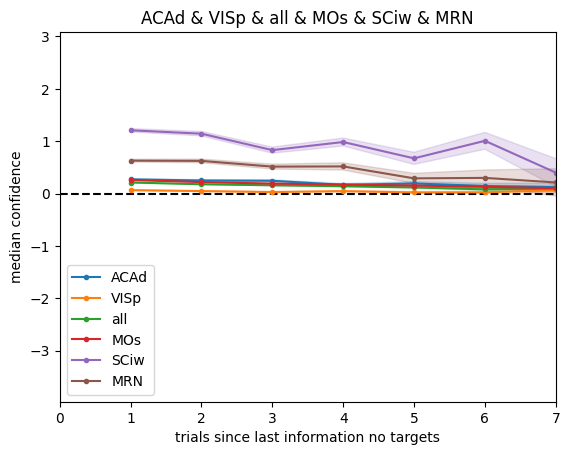

In [18]:
#plot median confidence per trial since rewarded target - multiple areas
sel_project='DynamicRouting'
areas=['ACAd','VISp','all','MOs','SCiw','MRN']

metric='trials_since_last_information_no_targets'
# metric='trials_since_rewarded_target'

fig,ax=plt.subplots(1,1)
ax.axhline(0,color='k',linestyle='--')

for aa in areas:
    sel_area=decoder_confidence_versus_trials_since_rewarded_target.query('area==@aa and project.str.contains(@sel_project)')
    #loop through rows and parse strings
    confidence=[]
    trials_since_rewarded_target=[]
    for rr,row in sel_area.iterrows():
        if type(row['confidence'])==str:
            temp_confidence=parse_strings_from_csv(row['confidence'])
            temp_trials_since_rewarded_target=parse_strings_from_csv(row[metric])
        else:
            temp_confidence=row['confidence']
            temp_trials_since_rewarded_target=row[metric]
            if 0 in temp_trials_since_rewarded_target:
                temp_trials_since_rewarded_target=temp_trials_since_rewarded_target[:-1]+1
                temp_confidence=temp_confidence[1:]
        if len(temp_confidence)==len(temp_trials_since_rewarded_target):
            confidence.append(temp_confidence)
            trials_since_rewarded_target.append(temp_trials_since_rewarded_target)
    # all_confidence=np.hstack(sel_area['confidence'].values)
    all_confidence=np.hstack(confidence)
    # all_trials_since_rewarded_target=np.hstack(sel_area['trials_since_rewarded_target'].values)
    all_trials_since_rewarded_target=np.hstack(trials_since_rewarded_target)

    #remove nans
    nan_inds=np.where(np.isnan(all_confidence)|np.isnan(all_trials_since_rewarded_target))[0]
    all_confidence=np.delete(all_confidence,nan_inds)
    all_trials_since_rewarded_target=np.delete(all_trials_since_rewarded_target,nan_inds)

    median_confidence=[]
    sem_confidence=[]
    for tt in np.unique(all_trials_since_rewarded_target):
        median_confidence.append(np.nanmedian(all_confidence[all_trials_since_rewarded_target==tt]))
        sem_confidence.append(stats.sem(all_confidence[all_trials_since_rewarded_target==tt]))
    
    
    l1=ax.plot(np.unique(all_trials_since_rewarded_target),median_confidence,'.-',label=aa)
    lcolor=l1[0].get_color()
    ax.fill_between(np.unique(all_trials_since_rewarded_target),np.array(median_confidence)-np.array(sem_confidence),
                    np.array(median_confidence)+np.array(sem_confidence),alpha=0.2,color=lcolor)

ax.set_xlabel(metric.replace('_',' '))
ax.set_ylabel('median confidence')
areas_concat_string=' & '.join(areas)
ax.set_title(areas_concat_string)
ax.set_xlim([0,7])
# ax.set_ylim([-0.05,0.30])

ax.legend()



C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\255104346.py:62: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  change_in_decoder_confidence_by_trial_type_area['rewarded_target_diff_sem'].append(stats.sem(np.hstack(sel_area['rewarded_target_plus_one']-sel_area['rewarded_target'])))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\255104346.py:68: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_diff_sem'].append(stats.sem(np.hstack(sel_area['non_rewarded_target_plus_one']-sel_area['non_rewarded_target'])))
C:\Users\ethan.mcbride\AppData\Local\Temp\ipykernel_71712\255104346.py:74: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size

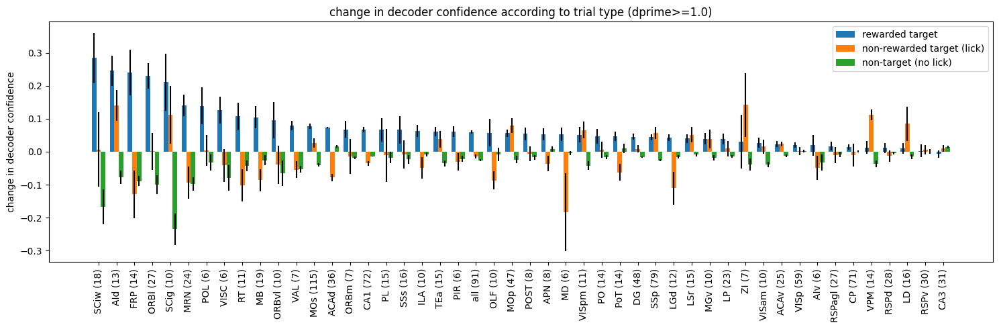

In [19]:
#plot change in decoder confidence by area

sel_project='DynamicRouting'
min_n_sessions=3
min_dprime=1.0
first_avg_session=False

change_in_decoder_confidence_by_trial_type_area={
    'area':[],
    'n_sessions':[],
    'rewarded_target':[],	
    'rewarded_target_plus_one':[],
    'rewarded_target_diff_mean':[],
    'rewarded_target_diff_sem':[],
    'rewarded_target_diff_p':[],
    'non_rewarded_target':[],	
    'non_rewarded_target_plus_one':[],
    'non_rewarded_target_diff_mean':[],
    'non_rewarded_target_diff_sem':[],
    'non_rewarded_target_diff_p':[],
    'non_rewarded_target_no_lick':[],
    'non_rewarded_target_no_lick_plus_one':[],
    'non_rewarded_target_no_lick_diff_mean':[],
    'non_rewarded_target_no_lick_diff_sem':[],
    'non_rewarded_target_no_lick_diff_p':[],
    'non_target_no_lick':[],
    'non_target_no_lick_plus_one':[],
    'non_target_no_lick_diff_mean':[],
    'non_target_no_lick_diff_sem':[],
    'non_target_no_lick_diff_p':[],

}

col_list=['rewarded_target','rewarded_target_plus_one','non_rewarded_target','non_rewarded_target_plus_one',
            'non_response_non_rewarded_target','non_response_non_rewarded_target_plus_one',
            'non_response_non_target_trials','non_response_non_target_trials_plus_one']

for aa in decoder_confidence_before_after_target['area'].unique():
    sel_area=decoder_confidence_before_after_target.query('area==@aa and project.str.contains(@sel_project) and cross_modal_dprime>=@min_dprime')
    if len(sel_area)==0:
        continue
    for ss,session in sel_area.iterrows():
        for col in col_list:
            # sel_area[col]=sel_area[col].apply(parse_strings_from_csv).mean
            if type(session[col])==str:
                session[col]=parse_strings_from_csv(session[col])
            sel_area.loc[ss,col]=np.nanmean(session[col])

    if first_avg_session:
        for ss,session in sel_area.iterrows():
            for col in col_list:
                #parse csv strings
                if type(session[col])==str:
                    session[col]=parse_strings_from_csv(session[col])
                sel_area.loc[ss,col]=session[col].mean()

    change_in_decoder_confidence_by_trial_type_area['area'].append(aa)
    change_in_decoder_confidence_by_trial_type_area['n_sessions'].append(len(sel_area))
    change_in_decoder_confidence_by_trial_type_area['rewarded_target'].append(np.hstack(sel_area['rewarded_target']))
    change_in_decoder_confidence_by_trial_type_area['rewarded_target_plus_one'].append(np.hstack(sel_area['rewarded_target_plus_one']))
    change_in_decoder_confidence_by_trial_type_area['rewarded_target_diff_mean'].append(np.nanmean(np.hstack(sel_area['rewarded_target_plus_one']-sel_area['rewarded_target'])))
    change_in_decoder_confidence_by_trial_type_area['rewarded_target_diff_sem'].append(stats.sem(np.hstack(sel_area['rewarded_target_plus_one']-sel_area['rewarded_target'])))
    change_in_decoder_confidence_by_trial_type_area['rewarded_target_diff_p'].append(stats.wilcoxon(np.hstack(sel_area['rewarded_target_plus_one']),np.hstack(sel_area['rewarded_target']))[1])

    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target'].append(sel_area['non_rewarded_target'])
    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_plus_one'].append(sel_area['non_rewarded_target_plus_one'])
    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_diff_mean'].append(np.nanmean(np.hstack(sel_area['non_rewarded_target_plus_one']-sel_area['non_rewarded_target'])))
    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_diff_sem'].append(stats.sem(np.hstack(sel_area['non_rewarded_target_plus_one']-sel_area['non_rewarded_target'])))
    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_diff_p'].append(stats.wilcoxon(np.hstack(sel_area['non_rewarded_target_plus_one']),np.hstack(sel_area['non_rewarded_target']))[1])

    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_no_lick'].append(sel_area['non_response_non_rewarded_target'])
    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_no_lick_plus_one'].append(sel_area['non_response_non_rewarded_target_plus_one'])
    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_no_lick_diff_mean'].append(np.nanmean(np.hstack(sel_area['non_response_non_rewarded_target_plus_one']-sel_area['non_response_non_rewarded_target'])))
    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_no_lick_diff_sem'].append(stats.sem(np.hstack(sel_area['non_response_non_rewarded_target_plus_one']-sel_area['non_response_non_rewarded_target'])))
    change_in_decoder_confidence_by_trial_type_area['non_rewarded_target_no_lick_diff_p'].append(stats.wilcoxon(np.hstack(sel_area['non_response_non_rewarded_target_plus_one']),np.hstack(sel_area['non_response_non_rewarded_target']))[1])
    
    change_in_decoder_confidence_by_trial_type_area['non_target_no_lick'].append(sel_area['non_response_non_target_trials'])
    change_in_decoder_confidence_by_trial_type_area['non_target_no_lick_plus_one'].append(sel_area['non_response_non_target_trials_plus_one'])
    change_in_decoder_confidence_by_trial_type_area['non_target_no_lick_diff_mean'].append(np.nanmean(np.hstack(sel_area['non_response_non_target_trials_plus_one']-sel_area['non_response_non_target_trials'])))
    change_in_decoder_confidence_by_trial_type_area['non_target_no_lick_diff_sem'].append(stats.sem(np.hstack(sel_area['non_response_non_target_trials_plus_one']-sel_area['non_response_non_target_trials'])))
    change_in_decoder_confidence_by_trial_type_area['non_target_no_lick_diff_p'].append(stats.wilcoxon(np.hstack(sel_area['non_response_non_target_trials_plus_one']),np.hstack(sel_area['non_response_non_target_trials']))[1])

change_in_decoder_confidence_by_trial_type_area=pd.DataFrame(change_in_decoder_confidence_by_trial_type_area)

plot_data=change_in_decoder_confidence_by_trial_type_area.query('n_sessions>=@min_n_sessions and \
                                                                (rewarded_target_diff_p<0.05 or \
                                                                non_rewarded_target_diff_p<0.05 or \
                                                                non_rewarded_target_no_lick_diff_p<0.05 or \
                                                                non_target_no_lick_diff_p<0.05)').sort_values(by='rewarded_target_diff_mean',ascending=False)

xvect=np.arange(len(plot_data))

fig,ax=plt.subplots(figsize=(15,5))
ax.bar(xvect-0.25,plot_data['rewarded_target_diff_mean'],yerr=plot_data['rewarded_target_diff_sem'],width=0.25)
ax.bar(xvect,plot_data['non_rewarded_target_diff_mean'],yerr=plot_data['non_rewarded_target_diff_sem'],width=0.25)
# ax.bar(xvect+0.1,plot_data['non_rewarded_target_no_lick_diff_mean'],yerr=plot_data['non_rewarded_target_no_lick_diff_sem'],width=0.2)
ax.bar(xvect+0.25,plot_data['non_target_no_lick_diff_mean'],yerr=plot_data['non_target_no_lick_diff_sem'],width=0.25)
# ax.legend(['rewarded target','non-rewarded target (lick)','non-rewarded target (no lick)','non-target (no lick)'])
ax.legend(['rewarded target','non-rewarded target (lick)','non-target (no lick)'])

area_labels=[]
for i in range(plot_data.shape[0]):
    area_labels.append(plot_data['area'].iloc[i]+' ('+str(plot_data['n_sessions'].iloc[i])+')')
ax.set_xticks(np.arange(len(plot_data)))
ax.set_xticklabels(area_labels,rotation=90,ha='center')
ax.set_ylabel('change in decoder confidence')

ax.set_title('change in decoder confidence according to trial type ('+'dprime>='+str(min_dprime)+')')

# ax.legend(['vis context','aud context'])

fig.tight_layout()




In [55]:
# sel_area=decoder_confidence_before_after_target.query('area=="ACAd" and project.str.contains(@sel_project) and cross_modal_dprime>=@min_dprime')

# for ss,session in sel_area.iterrows():
#     for col in col_list:
#         # sel_area[col]=sel_area[col].apply(parse_strings_from_csv).mean
#         session[col]=parse_strings_from_csv(session[col])
#         sel_area.loc[ss,col]=np.nanmean(session[col])


In [ ]:
sel_area